In [25]:
import warnings
warnings.filterwarnings("ignore")  
import matplotlib.pyplot as plt  
import numpy as np  
import pandas as pd 
import plotly.express as px
import seaborn as sns
from scipy import stats

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

np.random.seed(42)

In [26]:
# Importing dataset from our Online Sales file

online_df_data = pd.read_csv('./data/online_sales.csv')

# Creating a copy of the dataset (Original)

online_df = online_df_data.copy()

In [27]:
online_df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286392 entries, 0 to 286391
Data columns (total 36 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   order_id          286392 non-null  object 
 1   order_date        286392 non-null  object 
 2   status            286392 non-null  object 
 3   item_id           286392 non-null  float64
 4   sku               286392 non-null  object 
 5   qty_ordered       286392 non-null  float64
 6   price             286392 non-null  float64
 7   value             286392 non-null  float64
 8   discount_amount   286392 non-null  float64
 9   total             286392 non-null  float64
 10  category          286392 non-null  object 
 11  payment_method    286392 non-null  object 
 12  bi_st             286392 non-null  object 
 13  cust_id           286392 non-null  float64
 14  year              286392 non-null  int64  
 15  month             286392 non-null  object 
 16  ref_num           28

In [28]:
online_df

,order_id,order_date,status,item_id,sku,qty_ordered,price,value,discount_amount,total,...,SSN,Phone No.,Place Name,County,City,State,Zip,Region,User Name,Discount_Percent
0,100354678,2020-10-01,received,574772.0,oasis_Oasis-064-36,21.0,89.9,1798.0,0.0,1798.0,...,627-31-5251,405-959-1129,Vinson,Harmon,Vinson,OK,73571,South,jwtitus,0.0
1,100354678,2020-10-01,received,574774.0,Fantastic_FT-48,11.0,19.0,190.0,0.0,190.0,...,627-31-5251,405-959-1129,Vinson,Harmon,Vinson,OK,73571,South,jwtitus,0.0
2,100354680,2020-10-01,complete,574777.0,mdeal_DMC-610-8,9.0,149.9,1199.2,0.0,1199.2,...,627-31-5251,405-959-1129,Vinson,Harmon,Vinson,OK,73571,South,jwtitus,0.0
3,100354680,2020-10-01,complete,574779.0,oasis_Oasis-061-36,9.0,79.9,639.2,0.0,639.2,...,627-31-5251,405-959-1129,Vinson,Harmon,Vinson,OK,73571,South,jwtitus,0.0
4,100367357,2020-11-13,received,595185.0,MEFNAR59C38B6CA08CD,2.0,99.9,99.9,0.0,99.9,...,627-31-5251,405-959-1129,Vinson,Harmon,Vinson,OK,73571,South,jwtitus,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
286387,100562365,2021-09-30,paid,905179.0,APPCHA5AF14939B8F8A,2.0,4419.9,4419.9,0.0,4419.9,...,613-87-0361,212-772-7404,Rushville,Yates,Rushville,NY,14544,Northeast,bklatham,0.0
286388,100562376,2021-09-30,cod,905191.0,MEFCOT5A8D1E973B886,2.0,39.9,39.9,0.0,39.9,...,101-02-1040,229-817-9451,Lawrenceville,Gwinnett,Lawrenceville,GA,30044,South,bmbrunetti,0.0
286389,100562383,2021-09-30,cod,905200.0,WOFVAL59D5EA84167F9-M,2.0,40.0,40.0,0.0,40.0,...,399-31-7238,252-414-8396,Durham,Durham,Durham,NC,27701,South,fngiusti,0.0
286390,100562384,2021-09-30,cod,905202.0,WOFNIG5B4D7EB0E9FDD-L,2.0,49.9,49.9,0.0,49.9,...,399-31-7238,252-414-8396,Durham,Durham,Durham,NC,27701,South,fngiusti,0.0


In [29]:
columns_to_drop = ['sku', 'bi_st', 'ref_num', 'Name Prefix','First Name', 'Middle Initial', 'Last Name', 'full_name', 'E Mail', 'SSN', 'Phone No. ', 'Place Name', 'County', 'User Name']
online_df = online_df.drop(columns=columns_to_drop)

In [30]:
online_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286392 entries, 0 to 286391
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   order_id          286392 non-null  object 
 1   order_date        286392 non-null  object 
 2   status            286392 non-null  object 
 3   item_id           286392 non-null  float64
 4   qty_ordered       286392 non-null  float64
 5   price             286392 non-null  float64
 6   value             286392 non-null  float64
 7   discount_amount   286392 non-null  float64
 8   total             286392 non-null  float64
 9   category          286392 non-null  object 
 10  payment_method    286392 non-null  object 
 11  cust_id           286392 non-null  float64
 12  year              286392 non-null  int64  
 13  month             286392 non-null  object 
 14  Gender            286392 non-null  object 
 15  age               286392 non-null  float64
 16  Customer Since    28

In [31]:
online_df['order_date'].unique()

array(['2020-10-01', '2020-11-13', '2020-10-08', '2020-10-21',
       '2020-12-24', '2020-12-28', '2020-10-22', '2020-10-24',
       '2020-10-25', '2020-10-09', '2020-10-16', '2020-10-17',
       '2020-10-19', '2020-10-02', '2020-10-11', '2020-11-01',
       '2020-12-08', '2020-12-23', '2021-02-01', '2021-06-25',
       '2021-09-19', '2020-10-10', '2020-10-14', '2020-11-07',
       '2020-12-20', '2021-02-17', '2021-04-02', '2021-04-06',
       '2021-04-12', '2021-07-23', '2021-07-28', '2021-08-17',
       '2020-11-06', '2020-11-21', '2020-12-13', '2020-12-22',
       '2021-02-04', '2021-03-01', '2021-03-03', '2021-04-03',
       '2021-04-15', '2021-05-21', '2020-10-12', '2021-06-29',
       '2020-10-06', '2020-10-05', '2020-12-01', '2020-12-07',
       '2020-12-27', '2021-01-21', '2021-01-24', '2021-01-25',
       '2021-02-09', '2021-02-14', '2021-02-19', '2021-02-20',
       '2021-02-26', '2021-02-28', '2021-03-17', '2021-03-20',
       '2021-03-25', '2021-03-27', '2021-04-14', '2021-

In [32]:
online_df['order_date']=pd.to_datetime(online_df['order_date'])
online_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286392 entries, 0 to 286391
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   order_id          286392 non-null  object        
 1   order_date        286392 non-null  datetime64[ns]
 2   status            286392 non-null  object        
 3   item_id           286392 non-null  float64       
 4   qty_ordered       286392 non-null  float64       
 5   price             286392 non-null  float64       
 6   value             286392 non-null  float64       
 7   discount_amount   286392 non-null  float64       
 8   total             286392 non-null  float64       
 9   category          286392 non-null  object        
 10  payment_method    286392 non-null  object        
 11  cust_id           286392 non-null  float64       
 12  year              286392 non-null  int64         
 13  month             286392 non-null  object        
 14  Gend

## CATEGORICAL COLUMNS

In [33]:
# Converting columns to categorical

categorical_columns = ['status', 'category', 'payment_method', 'Gender', 'State', 'City', 'Region']
for col in categorical_columns:
    online_df[col] = online_df[col].astype('category')
    


# Converting ID columns to string

id_columns = ['order_id', 'item_id', 'cust_id', 'Zip']
for col in id_columns:
    online_df[col] = online_df[col].astype(str)
    

id_columns = ['qty_ordered', 'price', 'value', 'discount_amount','total']
for col in id_columns:
    online_df[col] = online_df[col].astype('float64')
    


# Converting `Customer Since` to datetime

online_df['Customer Since'] = pd.to_datetime(online_df['Customer Since'])



# Converting a column to float if necessary, for example, 'Discount_Percent'

online_df['Discount_Percent'] = online_df['Discount_Percent'].astype(float)



# 'year' and 'month' are treated as categorical
online_df['year'] = online_df['year'].astype(str)  # If not used for calculations
online_df['month'] = online_df['month'].astype('category')



# For the 'order_date' it should typically be parsed when reading the CSV, but it can also be converted after

online_df['order_date'] = pd.to_datetime(online_df['order_date'])

In [34]:
online_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286392 entries, 0 to 286391
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   order_id          286392 non-null  object        
 1   order_date        286392 non-null  datetime64[ns]
 2   status            286392 non-null  category      
 3   item_id           286392 non-null  object        
 4   qty_ordered       286392 non-null  float64       
 5   price             286392 non-null  float64       
 6   value             286392 non-null  float64       
 7   discount_amount   286392 non-null  float64       
 8   total             286392 non-null  float64       
 9   category          286392 non-null  category      
 10  payment_method    286392 non-null  category      
 11  cust_id           286392 non-null  object        
 12  year              286392 non-null  object        
 13  month             286392 non-null  category      
 14  Gend

## 'Data is  now cleaned and ready for evaluation'


# DESCRIPTIVE STATISTICAL ANALYSIS

# Numerical Columns:

In [35]:
online_df[['qty_ordered', 'price', 'value', 'discount_amount','total']].describe()

,qty_ordered,price,value,discount_amount,total
count,286392.000000,286392.000000,286392.000000,286392.000000,286392.000000
mean,3.011296,851.385253,885.879934,70.039427,815.840507
std,4.573837,1741.750751,2073.252179,256.880870,1983.580302
min,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,49.900000,49.900000,0.000000,49.900000
50%,2.000000,119.000000,158.970000,0.000000,149.800000
75%,3.000000,950.000000,910.000000,18.383050,800.000000
max,501.000000,101262.590000,101262.590000,30213.150000,101262.590000


The following `insights` are gathered from this output:

- The average quantity ordered is `3 items`, but with a `maximum of 501`, indicating occasional bulk purchases.

- There is a significant variance in item `prices`, with a `high standard deviation` pointing to a mix of both low and high-priced items.

- `Discounts` are commonly given, with some orders receiving very large discounts, suggesting promotional strategies or negotiations for bulk purchases.

- The mean total value of an order is slightly lower than the mean item value, confirming that `discounts` are `affecting` the `total sales` amount.

# Catergorical Columns

In [36]:
online_df[['status', 'category', 'payment_method', 'Gender', 'month', 'City', 'State', 'Region']].astype('object').describe()

,status,category,payment_method,Gender,month,City,State,Region
count,286392,286392,286392,286392,286392,286392,286392,286392
unique,13,15,13,2,12,15892,51,4
top,canceled,Mobiles & Tablets,cod,M,Dec-2020,Dekalb,TX,South
freq,112166,61761,102916,146184,82528,2525,17510,103482


The following `insights` are gathered from this output:

- A significant number of orders have been `canceled`, with `112,166 instances`, suggesting either a high rate of customer-initiated cancellations or potential issues with stock or order fulfillment.

- `Mobiles & Tablets` is the most popular category with `61,761 instances`, indicating a strong consumer demand for these products in the dataset.

- `Cash on Delivery` (cod) is the most common payment method used in `102,916 transactions`, which points to either a customer preference for this payment method or a lack of alternative options.

- `Male` (M) is the most frequent, suggesting a possible skew in `product targeting` or dataset collection methods.

- `December 2020` has the highest frequency of sales, which could be related to `holiday season` shopping.

- The dataset includes 51 states and 4 regions, with `Texas` (TX) in the `South` region having the `highest number of transactions`, pointing towards geographical market trends.

# Defining the Problem


The data analysis aims to uncover trends and insights that can drive business growth, enhance customer retention, and refine marketing approaches. The goal is to ascertain how the company can increase its income, evaluate the impact of discounts on sales performance, and determine whether regional factors impact sales.

# Hypothesis 1: Product Category Performance

The highest-sold online category in US e-commerce for 2020 was "Computers/Consumer Electronics," which accounted for 26.2% of Amazon's US sales. (Lipsman, 2020)

In [37]:
# Converting necessary columns to appropriate data types
online_df['qty_ordered'] = pd.to_numeric(online_df['qty_ordered'])
online_df['total'] = pd.to_numeric(online_df['total'])

# Aggregating data by product category and sort from highest to lowest
category_performance_qty = online_df.groupby('category')['qty_ordered'].sum().sort_values(ascending=False)
category_performance_sales = online_df.groupby('category')['total'].sum().sort_values(ascending=False)

# Plotting
plt.figure(figsize=(15, 6), dpi=1000)

# For Quantity Sold
plt.subplot(1, 2, 1)
sns.barplot(y=category_performance_qty.index, x=category_performance_qty.values, order=category_performance_qty.index)
plt.title('Quantity Sold by Product Category', fontweight='bold')
plt.ylabel('Quantity Sold', fontweight='bold')
plt.xlabel('Category', fontweight='bold')

# For Total Sales
plt.subplot(1, 2, 2)
sns.barplot(y=category_performance_sales.index, x=category_performance_sales.values, order=category_performance_sales.index)
plt.title('Total Sales by Product Category', fontweight='bold')
plt.ylabel('Total Sales', fontweight='bold')
plt.xlabel('Category', fontweight='bold')

plt.tight_layout()
plt.show()

- The category `Mobiles & Tablets` has the `highest quantity sold`, which aligns with the idea that `electronics` is a top-selling category online. While the hypothesis mentioned "Computers/Consumer Electronics," on this graph, mobiles and tablets are distinct and seem to be the leading sub-category.

- The `Computing` category appears to have a `significant share` of the `total sales value`. This supports my hypothesis about "Computers/Consumer Electronics" being a significant contributor to e-commerce sales, likely due to the higher average prices of these products compared to other categories.

- There's a noticeable difference between the quantity sold and the total sales value across categories. This indicates that `some categories may have a higher volume` but lower total sales value due to lower item prices and vice versa.

- The "Others" category has a substantial presence in both quantity sold and total sales, suggesting that it encompasses a wide range of products that do not fit into the standard categories but are significant in sales.

# Hypothesis 2:	Discount Impact on Sales

Orders with discounts have a higher average quantity ordered than orders without discounts.

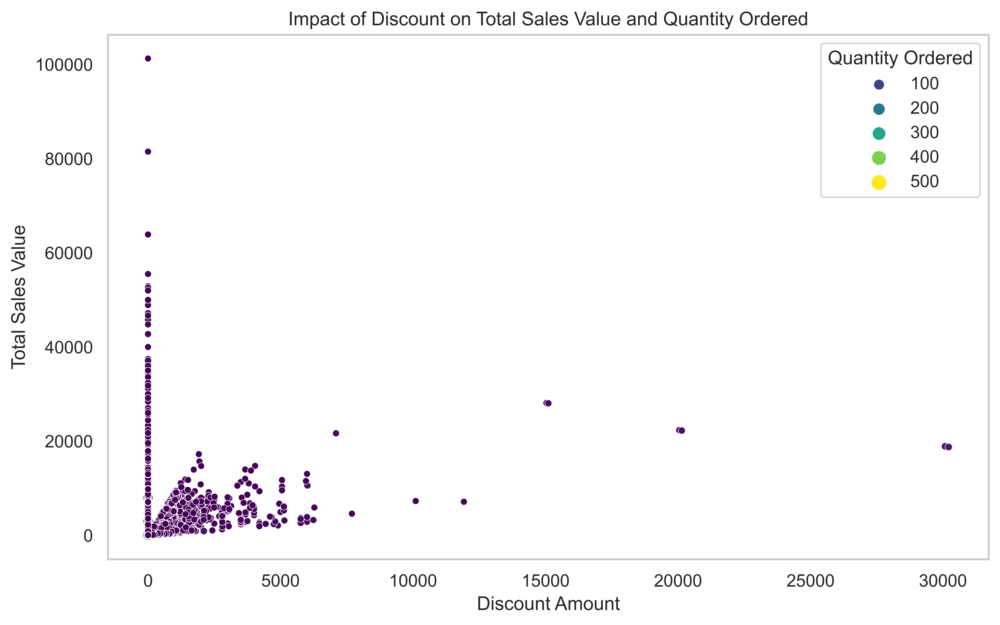

In [38]:
# Plotting
plt.figure(figsize=(10, 6), dpi=1000)
sns.scatterplot(data=online_df, x='discount_amount', y='total', size='qty_ordered', hue='qty_ordered', palette='viridis')

plt.title('Impact of Discount on Total Sales Value and Quantity Ordered')
plt.xlabel('Discount Amount')
plt.ylabel('Total Sales Value')
plt.legend(title='Quantity Ordered')
plt.grid(False)
plt.xlabel('Discount Amount')
plt.ylabel('Total Sales Value')
plt.title('Impact of Discount on Total Sales Value and Quantity Ordered')
plt.show()

 - **Concentration of Data Points**: A high concentration of data points at the lower end of the discount amount suggests that many orders have low to no discount. If the sizes of these points are generally smaller (representing the quantity ordered), it may indicate that orders without discounts tend to have a lower amount requested.

 - **Spread of Data Points with Higher Discounts**: As the discount amount increases, the points spread out, and we see some more prominent points emerging. This could imply that there are orders with higher discounts with a higher quantity ordered, supporting the hypothesis that discounts can lead to an increase in the amount requested.

 - **Outliers and Trends**: There are outliers with very high total sales values at various discount amounts. Suppose these points also represent higher quantities (which we must verify with the data points). In that case, it suggests that discounts do not uniformly lead to higher amounts ordered and that other factors may also significantly affect the total sales value.


## Statistical Analysis for more definitive evidence


One would typically perform statistical analysis on the underlying dataset to draw more concrete conclusions, including calculating the average quantity ordered for both discounted and non-discounted orders. The scatter plot did provide a visual indication. However, statistical tests would offer more definitive evidence for or against the hypothesis.

In [39]:
# Splitting the data into discounted and non-discounted orders
discounted = online_df[online_df['discount_amount'] > 0]
non_discounted = online_df[online_df['discount_amount'] == 0]

# Calculating the average quantity ordered for both discounted and non-discounted orders
avg_qty_ordered_discounted = discounted['qty_ordered'].mean()
avg_qty_ordered_non_discounted = non_discounted['qty_ordered'].mean()

# Output the average quantity ordered
print('Average quantity ordered with discount:', avg_qty_ordered_discounted)
print('Average quantity ordered without discount:', avg_qty_ordered_non_discounted)

# Performing an independent t-test (assuming the two samples have different variances)
t_stat, p_val = stats.ttest_ind(discounted['qty_ordered'], non_discounted['qty_ordered'], equal_var=False)

# Output the t-statistic and p-value
print('t-statistic:', t_stat)
print('p-value:', p_val)

Average quantity ordered with discount: 2.9574731145169944
Average quantity ordered without discount: 3.0342921787319717
t-statistic: -4.493090127037806
p-value: 7.0236329194294835e-06


### The following points are the interpretations of the statistical analysis:

- **Average Quantity Ordered**: The average quantity ordered with a discount is approximately `2.9575`. The average amount requested without a discount is `slightly higher`, about 3.0343. `Contrary to the hypothesis`, the data suggests that orders without a discount have a marginally higher average quantity ordered than those with a bargain.

- **Statistical Significance**: The t-statistic is -4.4931, which indicates that the difference in the means is statistically significant and not due to random chance. The p-value is approximately 0.000007, much lower than the common alpha level of 0.05. This strongly suggests a `statistically significant difference` in the `average quantity ordered between discounted and non-discounted orders`. The `negative t-statistic` indicates that the average amount collected is lower for discounted orders, which is the `opposite of the initial hypothesis`.

- **Implications for Business Strategy**: Despite discounts, customers sometimes order more items. on average, which could imply that the `discounts offered must be limited to incentivize` increased purchasing or other factors influencing purchase quantities. Businesses should reassess the effectiveness of their discount strategies, considering that offering a discount appears to drive fewer orders than one might expect.

## Visual Representation of the Statistics

In [40]:
# Calculating average quantity ordered for discounted and non-discounted orders
discounted = online_df[online_df['discount_amount'] > 0]
non_discounted = online_df[online_df['discount_amount'] == 0]
avg_qty_ordered_discounted = discounted['qty_ordered'].mean()
avg_qty_ordered_non_discounted = non_discounted['qty_ordered'].mean()

# Performing t-test
t_stat, p_val = stats.ttest_ind(discounted['qty_ordered'], non_discounted['qty_ordered'], equal_var=False)

# Setting the style for elegant visuals
sns.set(style="whitegrid", palette="pastel")
plt.rcParams.update({'font.size': 12})

# Creating elegant and beautiful visualizations with specified x-axis limits
plt.figure(figsize=(14, 7), dpi=1000)

# Distributing plot for quantity ordered with and without discount
plt.subplot(1, 2, 1)
sns.kdeplot(discounted['qty_ordered'], label='Discounted Orders', shade=True, clip=(0, 100))
sns.kdeplot(non_discounted['qty_ordered'], label='Non-Discounted Orders', shade=True, clip=(0, 100))
plt.title('Distribution of Quantity Ordered')
plt.xlabel('Quantity Ordered')
plt.ylabel('Density')
plt.grid(False)
plt.xlabel('Quantity Ordered', fontweight='bold')
plt.ylabel('Density', fontweight='bold')
plt.title('Distribution of Quantity Ordered', fontweight='bold')
plt.xlim(0, 25)
plt.legend()

# Bar plot for average quantity ordered comparison
plt.subplot(1, 2, 2)
sns.barplot(x=['Discounted', 'Non-Discounted'], y=[avg_qty_ordered_discounted, avg_qty_ordered_non_discounted])
plt.title('Average Quantity Ordered')
plt.title('Average Quantity Ordered', fontweight='bold')
plt.ylabel('Average Quantity')
plt.ylabel('Average Quantity', fontweight='bold')
plt.suptitle('Statistical Analysis of Quantity Ordered With and Without Discount')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()


# Output the results
(avg_qty_ordered_discounted, avg_qty_ordered_non_discounted, t_stat, p_val)


(2.9574731145169944,
 3.0342921787319717,
 -4.493090127037806,
 7.0236329194294835e-06)

# Hypothesis 3: Customer Loyalty and Sales Value

Customers with a longer history (‘Customer Since’) have a higher total sales value per order.


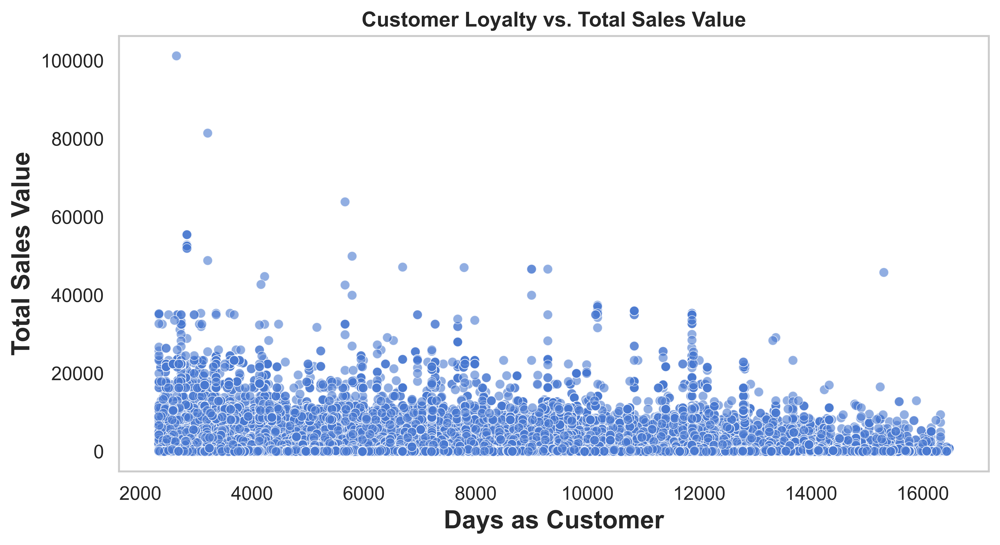

In [50]:
# Converting 'Customer Since' to datetime format if it's not already
online_df['Customer Since'] = pd.to_datetime(online_df['Customer Since'], errors='coerce')

# Calculating the number of days since the customer was acquired until now (or until the last date in my dataset)
current_date = pd.to_datetime('today')
online_df['Days As Customer'] = (current_date - online_df['Customer Since']).dt.days

# Setting the aesthetics for a more elegant look
sns.set_theme(context='notebook', style='whitegrid', palette='muted', font='sans-serif', font_scale=1.1)

# Creating the plot
plt.figure(figsize=(9, 5), dpi=1000)
sns.scatterplot(x='Days As Customer', y='total', data=online_df, alpha=0.6)

# Adjusting the plot details
plt.title('Customer Loyalty vs. Total Sales Value', fontsize=20)
plt.xlabel('Days as Customer', fontsize=16)
plt.ylabel('Total Sales Value', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.grid(False)
plt.xlabel('Days as Customer', fontweight='bold')
plt.ylabel('Total Sales Value', fontweight='bold')
plt.title('Customer Loyalty vs. Total Sales Value', fontweight='bold')
plt.tight_layout()
plt.show()

### Analysis based on the visualization:
    
* **Data Distribution**: The scatter plot shows a wide distribution of total sales values across various durations of customer loyalty. This suggests that the total sales value per order varies significantly among customers, regardless of how long they have been with the company.

* **Trend Analysis**: There is no clear upward trend that indicates an increase in total sales value with the length of customer loyalty. The data points do not cluster more densely at higher values as the days as a customer increase, which might suggest that simply being a long-term customer does not necessarily lead to higher sales values per order.

* **Outliers**: Several outliers with high total sales values do not correlate with a more extended customer history. This indicates that some customers may place high-value orders without necessarily having a long history with the company.

* **Hypothesis Evaluation**: Based on the scatter plot, customers with a more extended history have a higher total sales value per order, which the hypotheses cannot confirm. While there are instances of high sales values across the range of customer loyalty, there is no distinct pattern to suggest that increased loyalty leads to consistently higher sales values.

# Correlation

Statistical correlation analysis: To quantify the relationship between customer loyalty and sales value. Additionally, segmenting the data into customer groups based on loyalty duration and comparing their average sales values might provide further insights.

In [42]:
#Converting 'Customer Since' to datetime format if its not already
online_df['Customer Since'] = pd.to_datetime(online_df['Customer Since'], errors='coerce')

# Calculating the number of days since the customer was acquired until now (or until the last date in my dataset)
current_date = pd.to_datetime('today') # or the last date in my dataset
online_df['Days As Customer'] = (current_date - online_df['Customer Since']).dt.days

# Selecting columns that are relevant for analysis
columns_of_interest = ['Days As Customer', 'total', 'qty_ordered', 'price', 'discount_amount', 'value']

# Calculating the correlation matrix for these columns
correlation_matrix = online_df[columns_of_interest].corr()

# Visualization of the correlation matrix with dark blue palette
plt.figure(figsize=(9, 6), dpi=1000)
plt.xticks(rotation=90)  
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', center=0)
plt.title('Correlation Matrix for Customer Loyalty and Sales Value')
plt.title('Correlation Matrix for Customer Loyalty and Sales Value', fontweight='bold')
plt.show()

### Analysis based on the correlation:
    
* **Weak Correlation with Customer Loyalty**: The correlation between 'Days as Customer' and 'Total' (sales of each order) is weak, as the correlation coefficient is close to zero. The duration of customer loyalty does not have a strong linear relationship with the sales value per order, which does not support the hypothesis that customers with a more extended history have higher total sales values per order.

* **Strong Correlation with Price**: A strong positive correlation exists between 'price' and 'total'. Higher-priced items contribute to a higher total sales value. So, the item's price is a more significant determinant of the sales value than how long the customer has been with the company.

* **Moderate Correlation with Quantity Ordered**: There appears to be a moderate correlation between 'qty_ordered' and 'total.' Orders with more items tend to have a higher sales value, which is logical as purchasing more items would naturally increase the order's total value.

* **Low Correlation with Discount Amount**: The 'discount_amount' has a low correlation with the 'total.' Therefore, at least not linearly, discounts do not substantially affect the total sales value. Discounts encourage higher quantities but at a lower price, balancing out the total sales value.

# Segmenting the Customer Base

It's important to note that correlation does not imply causation. The lack of a strong correlation between customer loyalty and sales value does not necessarily mean that loyal customers are not valuable or do not contribute to higher sales in other non-linear ways. Further analysis might reveal more insights through different statistical methods or by segmenting the customer base.

## Analyzing Unique Values 

In [43]:
# Listing specific columns for which I might need for further analysis
columns_to_check = ['status', 'category', 'payment_method', 'year', 'month', 'Gender', 'age', 'City', 'State', 'Zip', 'Region']

for column in columns_to_check:
    if column in online_df.columns:
        print(f"Distinct values in '{column}':")
        print(online_df[column].unique())
        print("\n")
    else:
        print(f"Column '{column}' not found in DataFrame.")

Distinct values in 'status':
['received', 'complete', 'order_refunded', 'canceled', 'refund', ..., 'closed', 'pending', 'pending_paypal', 'payment_review', 'holded']
Length: 13
Categories (13, object): ['canceled', 'closed', 'cod', 'complete', ..., 'pending_paypal', 'processing', 'received', 'refund']


Distinct values in 'category':
['Men's Fashion', 'Mobiles & Tablets', 'Computing', 'Appliances', 'Home & Living', ..., 'Entertainment', 'Soghaat', 'Kids & Baby', 'Books', 'School & Education']
Length: 15
Categories (15, object): ['Appliances', 'Beauty & Grooming', 'Books', 'Computing', ..., 'School & Education', 'Soghaat', 'Superstore', 'Women's Fashion']


Distinct values in 'payment_method':
['cod', 'Payaxis', 'Easypay', 'jazzwallet', 'Easypay_MA', ..., 'bankalfalah', 'apg', 'mcblite', 'cashatdoorstep', 'financesettlement']
Length: 13
Categories (13, object): ['Easypay', 'Easypay_MA', 'Payaxis', 'apg', ..., 'financesettlement', 'jazzvoucher', 'jazzwallet', 'mcblite']


Distinct values

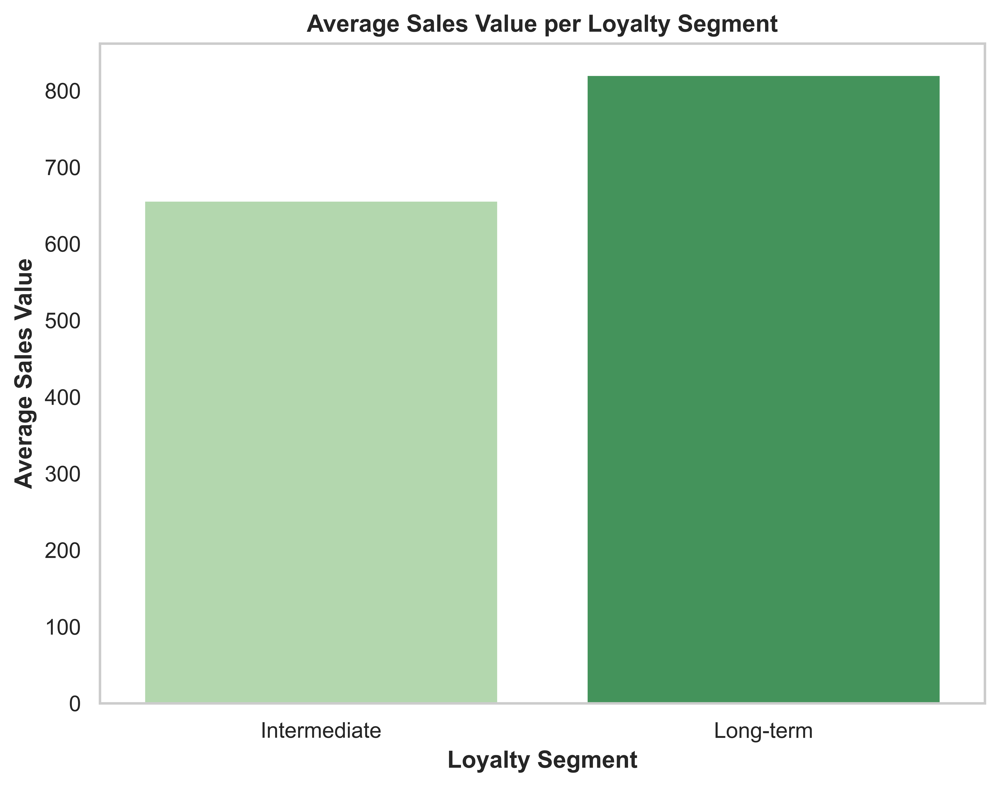

In [44]:
# Converting 'Customer Since' to datetime if it's not already
online_df['Customer Since'] = pd.to_datetime(online_df['Customer Since'])

# Calculating loyalty duration in years
online_df['Loyalty Years'] = online_df['order_date'].dt.year - online_df['Customer Since'].dt.year

def loyalty_segment(years):
    if years <= 1:
        return 'New'
    elif years <= 3:
        return 'Intermediate'
    elif years > 3:
        return 'Long-term'

online_df['Loyalty Segment'] = online_df['Loyalty Years'].apply(loyalty_segment)

# Setting the style of seaborn for better aesthetics
sns.set(style="whitegrid")

# Increasing the resolution for better quality
plt.figure(figsize=(8, 6), dpi=1000)

# Group by loyalty segment and calculate mean sales value
avg_sales_per_segment = online_df.groupby('Loyalty Segment')['total'].mean()

# Plotting with a green palette
sns.barplot(x=avg_sales_per_segment.index, y=avg_sales_per_segment.values, palette='Greens')

# Enhancing the labels and title
plt.xlabel('Loyalty Segment', fontweight='bold')
plt.ylabel('Average Sales Value', fontweight='bold')
plt.title('Average Sales Value per Loyalty Segment', fontweight='bold')

# Removing grid lines for a cleaner look
plt.grid(False)

# Show the plot
plt.show()

### Interpretation:


- **Higher Sales in the Long-Term Segment**: `Long-term customers` tend to have a `higher` average sales value per order than intermediate customers. Customers maintain their relationship with the company over an extended period, increasing their average spending per order.

- **Customer Loyalty Impact**: The visual representation `supports the hypothesis` that customer loyalty positively correlates with sales value. Long-term customers, possibly due to their trust in the brand and satisfaction with previous purchases, may be more willing to spend.

- **Strategic Implications**: This data can be critical for the company's strategic planning. Investment in customer retention programs may yield a higher return on investment, as retaining customers could lead to increased sales value over time.

- **Segmentation for Tailored Marketing**: Knowing that long-term customers have a higher sales value can lead to more targeted marketing strategies. Marketing campaigns can be customized to encourage higher spending where there's proven potential and loyalty programs can be designed to convert intermediate customers into long-term ones.

###### This analysis is crucial for the company to understand the importance of customer retention and the potential lifetime value of a customer. It also highlights the need for further investigation into what drives the higher spending among long-term customers, which could include factors like customer service, product quality, or personalized experiences.

## Additional Analysis: 

### **(1)** Total Quantity by Order Status

In [45]:
# (Group by 'status') and calculating the sum of 'qty_ordered' for each group
qty_ordered_by_status = online_df.groupby('status')['qty_ordered'].sum().reset_index()

# Sorting the results to see which status has the highest total quantity ordered
qty_ordered_by_status_sorted = qty_ordered_by_status.sort_values(by='qty_ordered', ascending=False)

# Extracting the order of statuses after sorting
status_order = qty_ordered_by_status_sorted['status'].tolist()

# Plotting
plt.figure(figsize=(12, 6), dpi=1000)
sns.barplot(
    data=qty_ordered_by_status_sorted, 
    x='status', 
    y='qty_ordered', 
    palette="Reds_d",  
    order=status_order  
)
plt.xticks(rotation=90)  
plt.title('Total Quantity Ordered by Order Status')
plt.xlabel('Order Status')
plt.ylabel('Total Quantity Ordered')
sns.despine() 
plt.grid(False)
plt.xlabel('Order Status', fontweight='bold')
plt.ylabel('Total Quantity Ordered', fontweight='bold')
plt.title('Total Quantity Ordered by Order Status', fontweight='bold')
plt.tight_layout()  
plt.show()

In [46]:
status_counts = online_df['status'].value_counts()
cancellation_rate = status_counts['canceled'] / status_counts.sum()
print(f'Cancellation Rate: {cancellation_rate:.2%}')

Cancellation Rate: 39.17%


The high volume of **canceled orders** contributes to `39.17%` of all orders, suggesting that examining the reasons behind these cancellations could be crucial for improving sales and customer retention strategies.

### **(2)** Average Order Value by Region

In [47]:
# Pivot table to analyze average order value by region
pivot_table = online_df.pivot_table(values='total', index='Region', aggfunc=np.mean).reset_index()

# Sorting the pivot table for top regions (modify this as needed for your data)
top_regions = pivot_table.sort_values(by='total', ascending=False)

# Plotting with Plotly Express
fig = px.bar(top_regions,
             y='Region',
             x='total',
             title ='Average Order Value by Region',
             labels ={'total': 'Average Order Value'})

fig.update_yaxes(categoryorder='total ascending')

fig.update_layout(xaxis=dict(tickformat='', hoverformat=',.0f'),
                  yaxis=dict(title='Region'),
                  xaxis_title='Average Order Value',
                  showlegend=False,
                  plot_bgcolor='rgb(246,246,246)')

fig.update_traces(marker_color='#00a0b0')

fig.update_traces(hovertemplate='%{x:,.0f}')

fig.show()

The South has the highest average order value, followed by the West, Northeast, and Midwest, according to the bar chart that compares the average order values across the four regions. According to this data, there are differences in consumer spending patterns across regions, with the South region having the highest order value.

In [48]:
# Grouping and unstacking data for the heatmap
country_product_analysis = online_df.groupby(['category', 'Region'])['qty_ordered'].sum().unstack()

# Rounding values to integers
country_product_analysis = country_product_analysis.round(0).astype(int)

# Creating the heatmap
plt.figure(figsize=(14, 8), dpi=1000)
sns.heatmap(country_product_analysis, cmap='GnBu', annot=True, fmt='d', linewidths=.5)

plt.title('Quantity Ordered by Category and Region', fontweight='bold')
plt.xlabel('Region', fontweight='bold')
plt.ylabel('Category', fontweight='bold')

plt.show()

### The following points are the interpretations of the statistical analysis:

- **Region with Highest Sales in a Category**: The Mobiles & Tablets category shows the highest quantity ordered in the South region compared to other regions and categories, i.e., a strong market presence or demand for these items.

- **omparatively Lower Sales in Certain Categories**: The 'Books' and 'School & Education' categories have significantly lower quantities ordered across all regions, indicating a lower demand or possibly that these products are not the platform's primary offerings.

- **Regional Preferences or Strengths**: The 'Men's Fashion' category has a higher quantity ordered in the 'Northeast' and 'South' regions compared to the 'Midwest' and 'West'. It indicates regional preferences for fashion or a more significant marketing push or availability in those regions.

- **Overall Sales Distribution**: The 'South' region has a generally higher quantity of items ordered across most categories, which suggests a more extensive customer base, more significant marketing efforts, or better distribution capabilities in that region.

#### These observations can be helpful for the business to strategize marketing, inventory distribution, and further analysis of customer behavior in different regions.


# Conclusion

***The detailed data analysis demonstrates a comprehensive understanding of the dataset's implications, leading to several critical insights and potential strategies for business growth. Comprehensive conclusions with innovative and creative solutions:***

- ***Product Category Performance and Implications***: The analysis reveals that `Mobiles & Tablets` is a leading product category in quantity sold, while 'Computing' contributes significantly to total sales value. This insight aligns with industry trends, indicating that electronics and computing devices are the top-selling categories in e-commerce. The company should consider expanding its inventory in these categories and exploring opportunities for bundling or cross-selling products to maximize revenue.

- ***Impact of Discounts on Sales Performance***: Contrary to initial hypotheses, the statistical analysis indicates that discounts do not significantly increase the average quantity ordered. This finding suggests that the current `discount strategy may need revisiting`. The company could experiment with different types of promotions or `focus on targeted discounting` based on customer purchase history and preferences to optimize the effectiveness of promotional strategies.

- ***Customer Loyalty and Sales Value***: While there is no strong correlation between customer loyalty and sales value per order, segmenting customers based on loyalty duration reveals that long-term customers tend to spend more. This insight emphasizes the importance of `customer retention strategies`. Implementing or enhancing loyalty programs, providing personalized services, and ensuring consistent product quality can help increase the lifetime value of these customers.

- ***Regional Trends and Marketing Strategy***: The data shows regional differences in product preferences and sales performance, with the `South` region leading in several categories. This finding suggests the potential for regionalized marketing strategies and inventory distribution. Tailoring marketing efforts to regional preferences and optimizing stock based on regional demand could lead to more efficient operations and increased sales.

- ***Cancellation Rates and Operational Efficiency***: The `high cancellation rate poses a concern` and highlights an area for operational improvement. We are investigating the reasons behind cancellations, whether due to stock issues, order fulfillment delays, or customer-initiated cancellations, is crucial. Addressing these issues could improve customer satisfaction and reduce lost sales.

- ***Innovative Solutions for Future Growth***:

    - **Data-Driven Product Development**: Use customer data to identify gaps in the product range or opportunities for exclusive products that cater to specific customer needs.
    - **AI and Machine Learning for Personalization**: Implement AI-driven recommendation systems to personalize the shopping experience for customers, potentially increasing average order value.
    - **Mobile Apps and Technology Utilization**: Considering the popularity of mobiles and tablets, investing in a user-friendly mobile application could enhance the shopping experience and increase sales.

- ***Sustainability and Ethical Practices***: Consumers are increasingly conscious of sustainability and ethical practices in today's market. The company could explore sustainable product lines or eco-friendly packaging options to appeal to environmentally conscious consumers.

***The insights from the data analysis should guide strategic decisions, focusing on product category expansion, personalized marketing, customer retention, regional optimization, operational efficiencies, technological advancements, and sustainability initiatives. The company can enhance its market position, drive business growth, and improve customer satisfaction by addressing these areas.***

# References:

Lipsman, A. (2020, July 22). US ecommerce by category 2020. Insider Intelligence. 
  https://www.insiderintelligence.com/content/us-ecommerce-by-category-2020 